Import all the required <font color="darkblue">**modules**</font> and <font color="darkblue">**libraries**<font>

In [ ]:
import pandas as pd
import numpy as np
import io
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
from matplotlib import rcParams
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from keras.initializers import *
from keras.wrappers.scikit_learn import KerasClassifier
from keras.models import *
from keras.layers import *
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, make_scorer
import time
from sklearn.ensemble import AdaBoostClassifier
from xgboost import XGBClassifier
%matplotlib inline

Load the <font color="darkblue">**CardioVascular Dataset**</font> 

In [ ]:
url = "https://raw.githubusercontent.com/vivek-joshi26/DataMining/main/cardio_train.csv"
df = pd.read_csv(url, sep=';')
from google.colab import data_table
data_table.enable_dataframe_formatter()


In [ ]:
df.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0


In [ ]:
df.describe()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
count,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000
mean,49972.419900,19468.865814,1.349571,164.359229,74.205690,128.817286,96.630414,1.366871,1.226457,0.088129,0.053771,0.803729,0.499700
std,28851.302323,2467.251667,0.476838,8.210126,14.395757,154.011419,188.472530,0.680250,0.572270,0.283484,0.225568,0.397179,0.500003
min,0.000000,10798.000000,1.000000,55.000000,10.000000,-150.000000,-70.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,25006.750000,17664.000000,1.000000,159.000000,65.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
50%,50001.500000,19703.000000,1.000000,165.000000,72.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
75%,74889.250000,21327.000000,2.000000,170.000000,82.000000,140.000000,90.000000,2.000000,1.000000,0.000000,0.000000,1.000000,1.000000
max,99999.000000,23713.000000,2.000000,250.000000,200.000000,16020.000000,11000.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000


Lets convert the age from <font color="darkblue">**days**</font> to <font color="darkblue">**years**</font>(integer values)

In [ ]:
df['age'] = df['age'].map(lambda age: round(age/365))

In [ ]:
df.describe()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
count,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000
mean,49972.419900,53.338686,1.349571,164.359229,74.205690,128.817286,96.630414,1.366871,1.226457,0.088129,0.053771,0.803729,0.499700
std,28851.302323,6.765294,0.476838,8.210126,14.395757,154.011419,188.472530,0.680250,0.572270,0.283484,0.225568,0.397179,0.500003
min,0.000000,30.000000,1.000000,55.000000,10.000000,-150.000000,-70.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,25006.750000,48.000000,1.000000,159.000000,65.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
50%,50001.500000,54.000000,1.000000,165.000000,72.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
75%,74889.250000,58.000000,2.000000,170.000000,82.000000,140.000000,90.000000,2.000000,1.000000,0.000000,0.000000,1.000000,1.000000
max,99999.000000,65.000000,2.000000,250.000000,200.000000,16020.000000,11000.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70000 entries, 0 to 69999
Data columns (total 13 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   id           70000 non-null  int64  
 1   age          70000 non-null  int64  
 2   gender       70000 non-null  int64  
 3   height       70000 non-null  int64  
 4   weight       70000 non-null  float64
 5   ap_hi        70000 non-null  int64  
 6   ap_lo        70000 non-null  int64  
 7   cholesterol  70000 non-null  int64  
 8   gluc         70000 non-null  int64  
 9   smoke        70000 non-null  int64  
 10  alco         70000 non-null  int64  
 11  active       70000 non-null  int64  
 12  cardio       70000 non-null  int64  
dtypes: float64(1), int64(12)
memory usage: 6.9 MB


The CardioVascular dataset has <font color="darkblue">**13 attributes**</font> and a total of around <font color="darkblue">**70k records**</font>

In [ ]:
print('Number of null values in Age: {}'.format(df['age'].isnull().sum()))
print('Number of null values in Height: {}'.format(df['height'].isnull().sum()))
print('Number of null values in Weight: {}'.format(df['weight'].isnull().sum()))
print('Number of null values in ap_hi: {}'.format(df['ap_hi'].isnull().sum()))
print('Number of null values in ap_lo: {}'.format(df['ap_lo'].isnull().sum()))
print('Number of null values in smoke: {}'.format(df['smoke'].isnull().sum()))
print('Number of null values in alco: {}'.format(df['alco'].isnull().sum()))
print('Number of null values in active: {}'.format(df['active'].isnull().sum()))

Number of null values in Age: 0
Number of null values in Height: 0
Number of null values in Weight: 0
Number of null values in ap_hi: 0
Number of null values in ap_lo: 0
Number of null values in smoke: 0
Number of null values in alco: 0
Number of null values in active: 0


## Data Visualization

In [ ]:
dfWithActualValues = df.copy()

In [ ]:
def ActualValue(x):
  if x==1:
    return "Normal" 
  elif x==2:
    return "Above Normal"
  else:
    return "Well Above Normal"

dfWithActualValues["gender"] = dfWithActualValues["gender"].map(lambda gender: "men" if gender==2 else "women" )
dfWithActualValues["smoke"] = dfWithActualValues["smoke"].map(lambda smoke: "smokes" if smoke==1 else "Doesn't smoke" )
dfWithActualValues["alco"] = dfWithActualValues["alco"].map(lambda alco: "Drinks Alcohol" if alco==1 else "Doesn't drink alcohol" )
dfWithActualValues["gluc"] = dfWithActualValues["gluc"].map(lambda gluc :ActualValue(gluc))
dfWithActualValues["cholesterol"] = dfWithActualValues["cholesterol"].map(lambda chol :ActualValue(chol))
dfWithActualValues["active"] = dfWithActualValues["active"].map(lambda active: "Active" if active==1 else "Not Active")

In [ ]:
def ActualBPValue(row):
  if row.ap_hi<120 and row.ap_lo<80:
    return "Normal" 
  elif row.ap_hi>=120 and row.ap_hi<=129 and row.ap_lo<80:
    return "Elevated"
  elif (row.ap_hi>=130 and row.ap_hi<=139) or (row.ap_lo>=80 and row.ap_lo<=89):
    return "High Blood Pressure (HyperExtension Stage 1)"
  elif row.ap_hi>=140 and row.ap_hi<=180 and row.ap_lo>=90 and row.ap_lo<=120:
    return "High Blood Pressure (HyperExtension Stage 2)"
  else:
    return "Hypertensive Crisis (Seek Emergency Care)"

dfWithActualValues.insert(7, 'BloodPressure',df.apply(lambda row:ActualBPValue(row), axis=1)  )

In [ ]:
dfWithActualValues.head()

,id,age,gender,height,weight,ap_hi,ap_lo,BloodPressure,cholesterol,gluc,smoke,alco,active,cardio
0,0,50,men,168,62.0,110,80,High Blood Pressure (HyperExtension Stage 1),Normal,Normal,Doesn't smoke,Doesn't drink alcohol,Active,0
1,1,55,women,156,85.0,140,90,High Blood Pressure (HyperExtension Stage 2),Well Above Normal,Normal,Doesn't smoke,Doesn't drink alcohol,Active,1
2,2,52,women,165,64.0,130,70,High Blood Pressure (HyperExtension Stage 1),Well Above Normal,Normal,Doesn't smoke,Doesn't drink alcohol,Not Active,1
3,3,48,men,169,82.0,150,100,High Blood Pressure (HyperExtension Stage 2),Normal,Normal,Doesn't smoke,Doesn't drink alcohol,Active,1
4,4,48,women,156,56.0,100,60,Normal,Normal,Normal,Doesn't smoke,Doesn't drink alcohol,Not Active,0


#### <font color="darkblue">Univariate Analysis</font>

Let's plot a countplot for our categorical variables


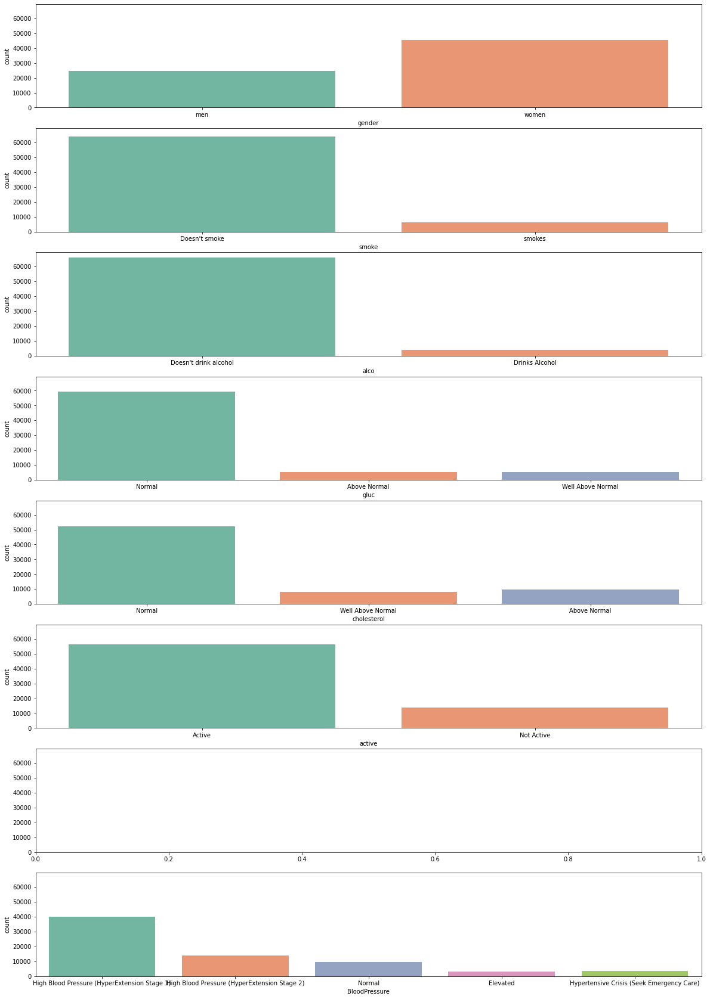

In [ ]:
f, axes = plt.subplots(8 ,figsize=(20, 30), sharex=False,sharey=True)
sns.countplot(x='gender',data=dfWithActualValues,ax=axes[0],palette="Set2")
sns.countplot(x='smoke',data=dfWithActualValues,ax=axes[1],palette="Set2")
sns.countplot(x='alco',data=dfWithActualValues,ax=axes[2],palette="Set2")
sns.countplot(x='gluc',data=dfWithActualValues,ax=axes[3],palette="Set2")
sns.countplot(x='cholesterol',data=dfWithActualValues,ax=axes[4],palette="Set2")
sns.countplot(x='active',data=dfWithActualValues,ax=axes[5],palette="Set2")
sns.countplot(x='BloodPressure',data=dfWithActualValues,ax=axes[7],palette="Set2");

As we can see from the above plot:<br>- We have <font color="darkblue">**twice**</font> the data of women than men.<br>- More than <font color="darkblue">**six times**</font> the data of people who don't smoke than people who smoke.<br>- More than <font color="darkblue">**seven times**</font> the data of people who don't drink alcohol than people who drink alcohol.<br>- More than <font color="darkblue">**seven times**</font> the data of people who have normal glucose and having normal cholestrol than people having above normal glucose and cholestrol<br>- More than <font color="darkblue">**five times**</font> the data of people who are active than who are not active.

In [ ]:
df.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,50,2,168,62.0,110,80,1,1,0,0,1,0
1,1,55,1,156,85.0,140,90,3,1,0,0,1,1
2,2,52,1,165,64.0,130,70,3,1,0,0,0,1
3,3,48,2,169,82.0,150,100,1,1,0,0,1,1
4,4,48,1,156,56.0,100,60,1,1,0,0,0,0


#### <font color="darkblue">Bivariate Analysis</font>

Let's plot a kdeplot for the continuous variable Age

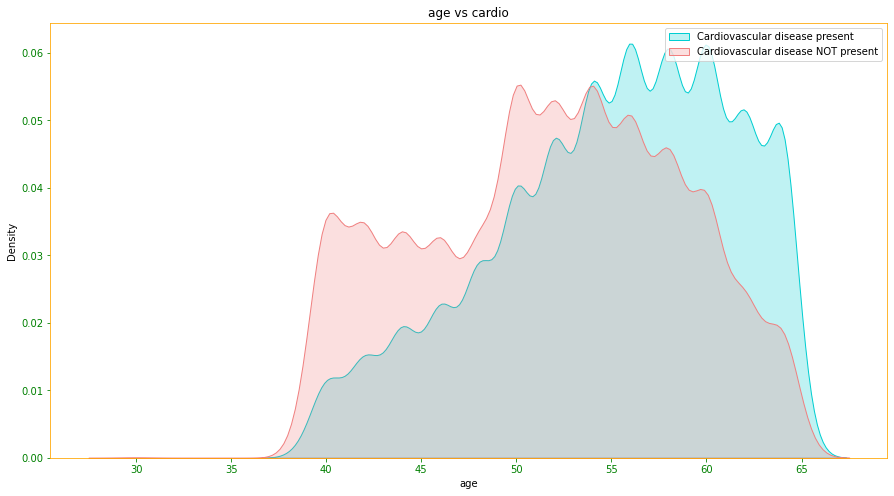

In [ ]:
with plt.rc_context({'axes.edgecolor':'orange','xtick.color':'green', 'ytick.color':'green', 'figure.facecolor':'white'}):
    plt.figure(figsize=(15, 8))

    sns.kdeplot(
    df.age[df.cardio==1],
        color = 'darkturquoise',
        shade=True
    )

    sns.kdeplot(
    df.age[df.cardio==0],
    color='lightcoral',
    shade = True
    )

    plt.legend(['Cardiovascular disease present', 'Cardiovascular disease NOT present'])
    plt.title('age vs cardio')
    plt.savefig('part_e.png')
    # plt.xlim(0, 100)
    plt.show()

Here, we can see that as age increases the cases of cardio disease also increases.<br> Also, <font color="darkblue">it can be observed that **people over 54 years of age are more exposed to CVD.**</font>



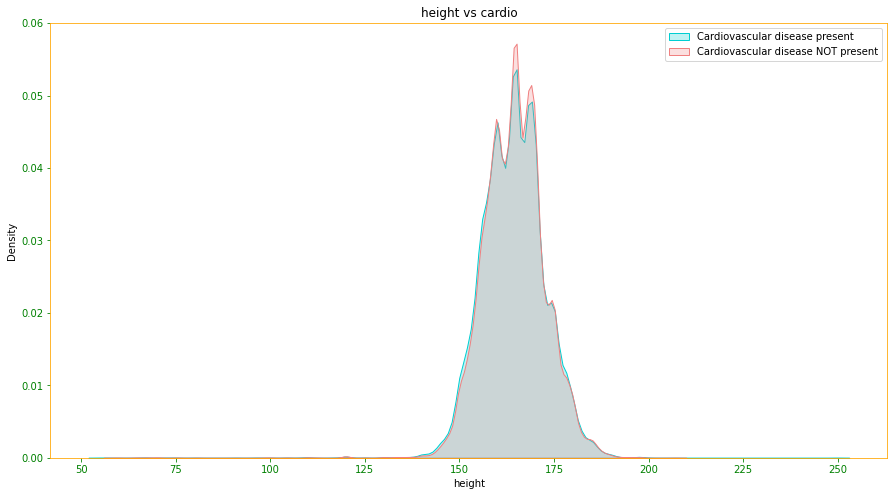

In [ ]:
with plt.rc_context({'axes.edgecolor':'orange','xtick.color':'green', 'ytick.color':'green', 'figure.facecolor':'white'}):
    plt.figure(figsize=(15, 8))

    sns.kdeplot(
    df.height[df.cardio==1],
        color = 'darkturquoise',
        shade=True
    )

    sns.kdeplot(
    df.height[df.cardio==0],
    color='lightcoral',
    shade = True
    )

    plt.legend(['Cardiovascular disease present', 'Cardiovascular disease NOT present'])
    plt.title('height vs cardio')
    plt.savefig('part_e.png')
    # plt.xlim(0, 100)
    plt.show()

There is <font color="darkblue">**no relation**</font> between height and presence of cardiovascular disease

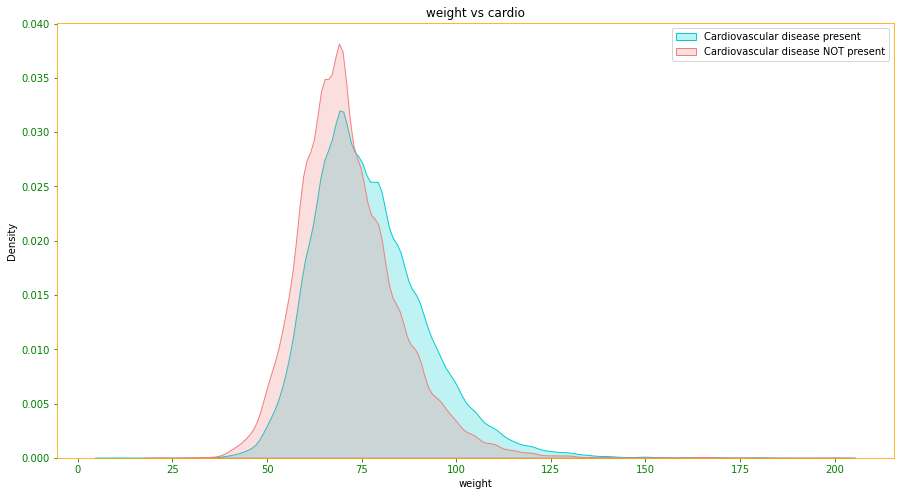

In [ ]:
with plt.rc_context({'axes.edgecolor':'orange','xtick.color':'green', 'ytick.color':'green', 'figure.facecolor':'white'}):
    plt.figure(figsize=(15, 8))

    sns.kdeplot(
    df.weight[df.cardio==1],
        color = 'darkturquoise',
        shade=True
    )

    sns.kdeplot(
    df.weight[df.cardio==0],
    color='lightcoral',
    shade = True
    )

    plt.legend(['Cardiovascular disease present', 'Cardiovascular disease NOT present'])
    plt.title('weight vs cardio')
    plt.savefig('part_e.png')
    # plt.xlim(0, 100)
    plt.show()

Here we can see, as the <font color="darkblue">weight starts increasing after 75kgs, the probability of CVD also increases slightly.</font>

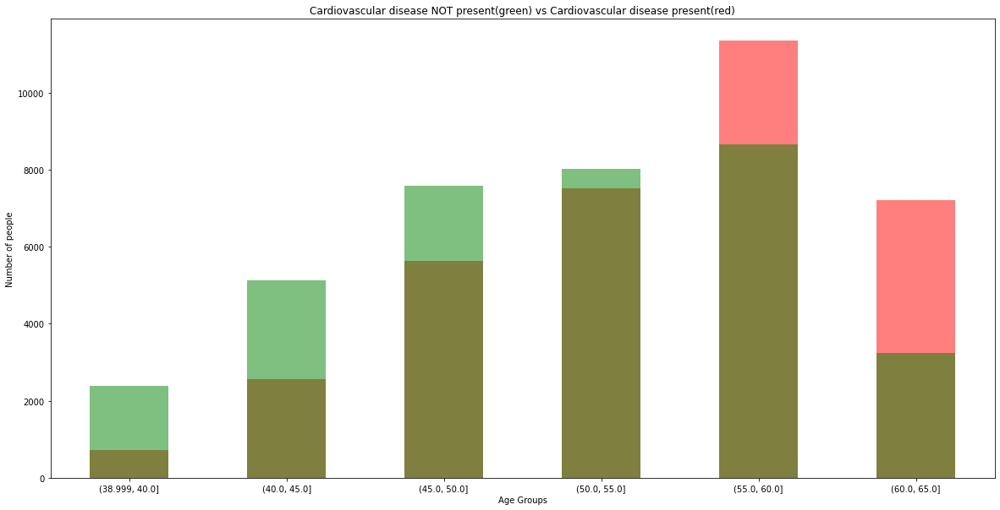

In [ ]:
bins = (39,40, 45 , 50, 55, 60, 65)

df_ages = df.loc[df['cardio']==1, ['age']]

df_ages = df_ages.squeeze()

out = pd.cut(
    df_ages,
    bins = bins,
    include_lowest= True
)

ax = out.value_counts(sort=False).plot.bar(
    rot=0,
    color="red",
    figsize=(20, 10),
    alpha=0.5
)


bins = (39,40, 45 , 50, 55, 60, 65)

df_ages = df.loc[df['cardio']==0, ['age']]

df_ages = df_ages.squeeze()

out = pd.cut(
    df_ages,
    bins = bins,
    include_lowest= True
)

ax1 = out.value_counts(sort=False).plot.bar(
    rot=0,
    color="green",
    figsize=(20, 10),
    alpha=0.5
)

plt.xlabel('Age Groups')
plt.ylabel("Number of people")
plt.title("Cardiovascular disease NOT present(green) vs Cardiovascular disease present(red)")
plt.show()

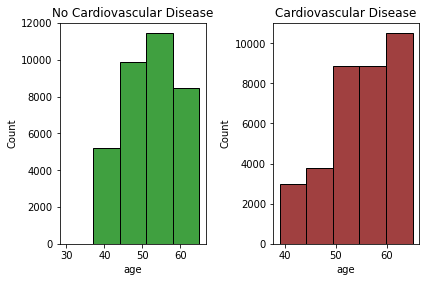

In [ ]:
plt.subplot(1, 2, 1)
sns.histplot(data = df.age[df.cardio == 0], bins=5, color='green').set(title='No Cardiovascular Disease')
plt.subplot(1, 2, 2)
sns.histplot(data = df.age[df.cardio == 1], bins=5, color="maroon").set(title='Cardiovascular Disease')
plt.tight_layout(pad=1.0)

gender      1      2
cardio              
0       22914  12107
1       22616  12363


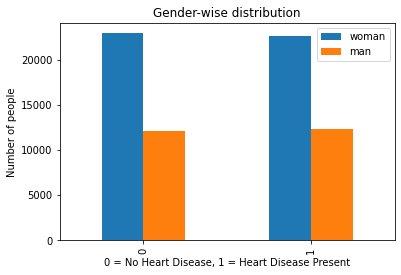

In [ ]:
print(pd.crosstab(df['cardio'], df['gender']))
pd.crosstab(df['cardio'], df['gender']).plot(kind = 'bar') # crosstab computes a frequency table kind of thing.
plt.xlabel('0 = No Heart Disease, 1 = Heart Disease Present')
plt.ylabel('Number of people')
plt.legend(['woman','man'])
#plt.legend([1,2],['woman','man'])
plt.title("Gender-wise distribution")
plt.show()

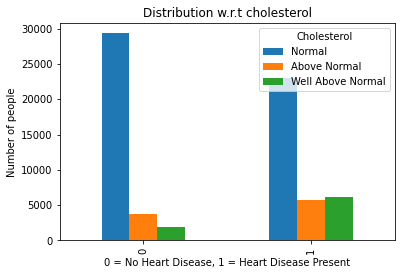

In [ ]:
ax = pd.crosstab(df['cardio'], df['cholesterol']).plot(kind = 'bar',
                                                  title='Distribution w.r.t cholesterol',
                                                  xlabel='0 = No Heart Disease, 1 = Heart Disease Present',
                                                  ylabel='Number of people'
                                                 )
#new_labels = ['Above Normal','High', 'Normal']
new_labels = [ 'Normal', 'Above Normal', 'Well Above Normal' ]
handler, _ = ax.get_legend_handles_labels()
ax.legend(handler, new_labels, loc='upper right', title='Cholesterol')

In [ ]:
df

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,50,2,168,62.0,110,80,1,1,0,0,1,0
1,1,55,1,156,85.0,140,90,3,1,0,0,1,1
2,2,52,1,165,64.0,130,70,3,1,0,0,0,1
3,3,48,2,169,82.0,150,100,1,1,0,0,1,1
4,4,48,1,156,56.0,100,60,1,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
69995,99993,53,2,168,76.0,120,80,1,1,1,0,1,0
69996,99995,62,1,158,126.0,140,90,2,2,0,0,1,1
69997,99996,52,2,183,105.0,180,90,3,1,0,1,0,1
69998,99998,61,1,163,72.0,135,80,1,2,0,0,0,1


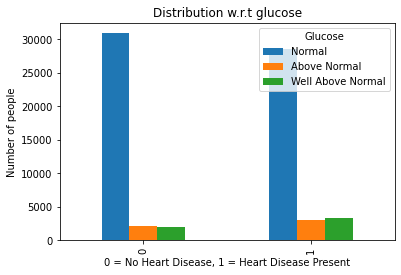

In [ ]:
ax = pd.crosstab(df['cardio'], df['gluc']).plot(kind = 'bar',
                                                  title='Distribution w.r.t glucose',
                                                  xlabel='0 = No Heart Disease, 1 = Heart Disease Present',
                                                  ylabel='Number of people'
                                                 )
new_labels = ['Normal', 'Above Normal', 'Well Above Normal']
handler, _ = ax.get_legend_handles_labels()
ax.legend(handler, new_labels, loc='upper right', title='Glucose')

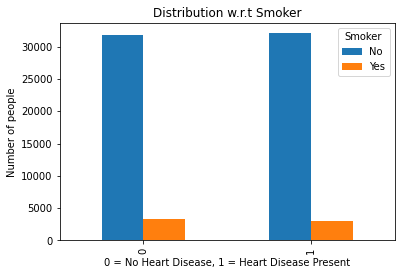

In [ ]:
ax = pd.crosstab(df['cardio'], df['smoke']).plot(kind = 'bar',
                                                  title='Distribution w.r.t Smoker',
                                                  xlabel='0 = No Heart Disease, 1 = Heart Disease Present',
                                                  ylabel='Number of people'
                                                 )
new_labels = ['No', 'Yes']
handler, _ = ax.get_legend_handles_labels()
ax.legend(handler, new_labels, loc='upper right', title='Smoker');

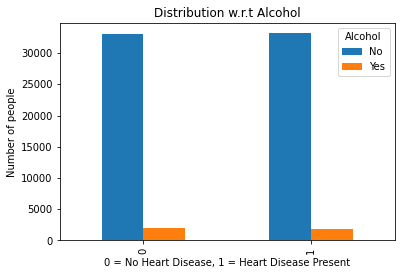

In [ ]:
ax = pd.crosstab(df['cardio'], df['alco']).plot(kind = 'bar',
                                                  title='Distribution w.r.t Alcohol',
                                                  xlabel='0 = No Heart Disease, 1 = Heart Disease Present',
                                                  ylabel='Number of people'
                                                 )
new_labels = ['No', 'Yes']
handler, _ = ax.get_legend_handles_labels()
ax.legend(handler, new_labels, loc='upper right', title='Alcohol')

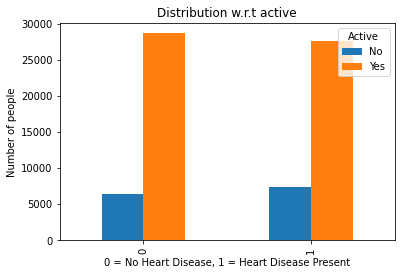

In [ ]:
ax = pd.crosstab(df['cardio'], df['active']).plot(kind = 'bar',
                                                  title='Distribution w.r.t active',
                                                  xlabel='0 = No Heart Disease, 1 = Heart Disease Present',
                                                  ylabel='Number of people'
                                                 )
new_labels = ['No', 'Yes']
handler, _ = ax.get_legend_handles_labels()
ax.legend(handler, new_labels, loc='upper right', title='Active')

In [ ]:
dfWithActualValues.head()

,id,age,gender,height,weight,ap_hi,ap_lo,BloodPressure,cholesterol,gluc,smoke,alco,active,cardio
0,0,50,men,168,62.0,110,80,High Blood Pressure (HyperExtension Stage 1),Normal,Normal,Doesn't smoke,Doesn't drink alcohol,Active,0
1,1,55,women,156,85.0,140,90,High Blood Pressure (HyperExtension Stage 2),Well Above Normal,Normal,Doesn't smoke,Doesn't drink alcohol,Active,1
2,2,52,women,165,64.0,130,70,High Blood Pressure (HyperExtension Stage 1),Well Above Normal,Normal,Doesn't smoke,Doesn't drink alcohol,Not Active,1
3,3,48,men,169,82.0,150,100,High Blood Pressure (HyperExtension Stage 2),Normal,Normal,Doesn't smoke,Doesn't drink alcohol,Active,1
4,4,48,women,156,56.0,100,60,Normal,Normal,Normal,Doesn't smoke,Doesn't drink alcohol,Not Active,0


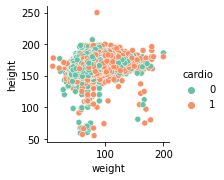

In [ ]:
sns.pairplot(df, x_vars=['weight'], y_vars=['height'], hue='cardio', palette='Set2');

<font color="darkblue">**No relationship**</font> found between <font color="darkblue">**height**</font> and <font color="darkblue">**weight**</font>

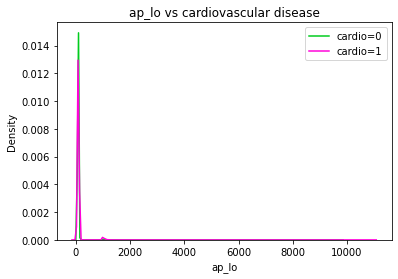

In [ ]:
sns.kdeplot(df.ap_lo[df.cardio==0], color='#00cc1d')
sns.kdeplot(df.ap_lo[df.cardio==1], color='#ff02d9')
plt.title("ap_lo vs cardiovascular disease")
plt.legend(['cardio=0', 'cardio=1'])
plt.show();

Check For Outliers

In [ ]:
df.describe()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
count,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000
mean,49972.419900,53.338686,1.349571,164.359229,74.205690,128.817286,96.630414,1.366871,1.226457,0.088129,0.053771,0.803729,0.499700
std,28851.302323,6.765294,0.476838,8.210126,14.395757,154.011419,188.472530,0.680250,0.572270,0.283484,0.225568,0.397179,0.500003
min,0.000000,30.000000,1.000000,55.000000,10.000000,-150.000000,-70.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,25006.750000,48.000000,1.000000,159.000000,65.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
50%,50001.500000,54.000000,1.000000,165.000000,72.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
75%,74889.250000,58.000000,2.000000,170.000000,82.000000,140.000000,90.000000,2.000000,1.000000,0.000000,0.000000,1.000000,1.000000
max,99999.000000,65.000000,2.000000,250.000000,200.000000,16020.000000,11000.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000


Outliers detected in <font color="darkblue">**ap_hi**</font> and <font color="darkblue">**ap_lo**</font>

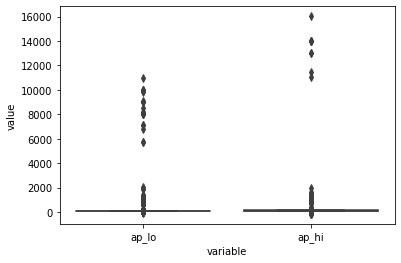

In [ ]:
blood_pressure = df.loc[:,['ap_lo','ap_hi']]
sns.boxplot(x = 'variable',y = 'value',data = blood_pressure.melt())

In [ ]:
print("Count of Diastilic pressure being higher than systolic one is {0}".format(df[df['ap_lo']> df['ap_hi']].shape[0]))

Count of Diastilic pressure being higher than systolic one is 1234


Let's <font color="darkblue">**get rid**</font> of this outliers in <font color="darkblue">**ap_hi**</font> and <font color="darkblue">**ap_lo**</font>

In [ ]:
df=df.query('70 < ap_hi < 240 & 40 < ap_lo < 180 & ap_hi> ap_lo')

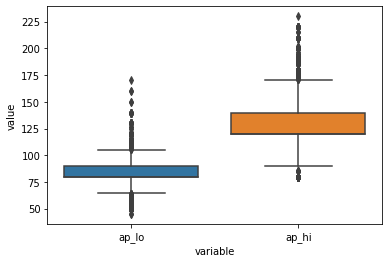

In [ ]:
blood_pressure = df.loc[:,['ap_lo','ap_hi']]
sns.boxplot(x = 'variable',y = 'value',data = blood_pressure.melt())

In [ ]:
df.describe()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
count,68645.000000,68645.000000,68645.000000,68645.000000,68645.000000,68645.000000,68645.000000,68645.000000,68645.000000,68645.000000,68645.000000,68645.000000,68645.000000
mean,49977.304538,53.326928,1.348620,164.362066,74.118137,126.664142,81.311064,1.364615,1.225697,0.087974,0.053347,0.803380,0.494661
std,28846.376715,6.767720,0.476537,8.183036,14.329662,16.644084,9.409704,0.678886,0.571580,0.283260,0.224726,0.397446,0.499975
min,0.000000,30.000000,1.000000,55.000000,11.000000,80.000000,45.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,25003.000000,48.000000,1.000000,159.000000,65.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
50%,50016.000000,54.000000,1.000000,165.000000,72.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
75%,74876.000000,58.000000,2.000000,170.000000,82.000000,140.000000,90.000000,2.000000,1.000000,0.000000,0.000000,1.000000,1.000000
max,99999.000000,65.000000,2.000000,250.000000,200.000000,230.000000,170.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000


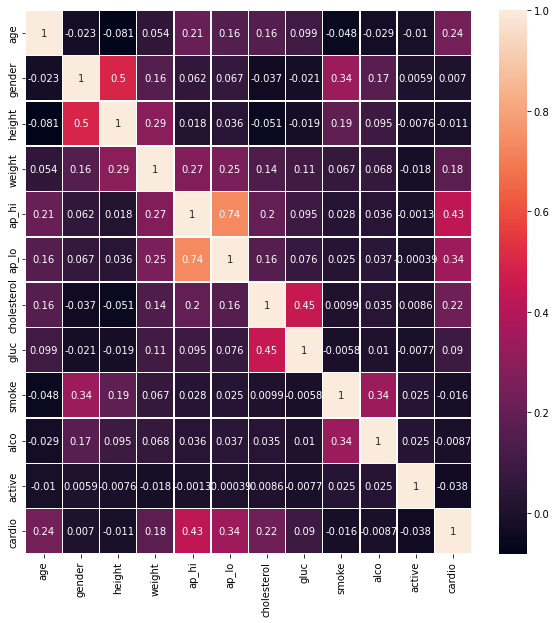

In [ ]:
corr = df.iloc[:,1:13].corr()
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(corr, annot=True, linewidths=.5, ax=ax);

As we can see from the above heatmap, <font color="darkblue">**ap_hi-ap_lo**</font> and<font color="darkblue"> **gluc-cholesterol**</font> have got some considerable relation between them. Also, <font color="darkblue">**cardio**</font> is considerably related to <font color="darkblue">**ap_hi**</font> and to extent with <font color="darkblue">**ap_lo**.</font>

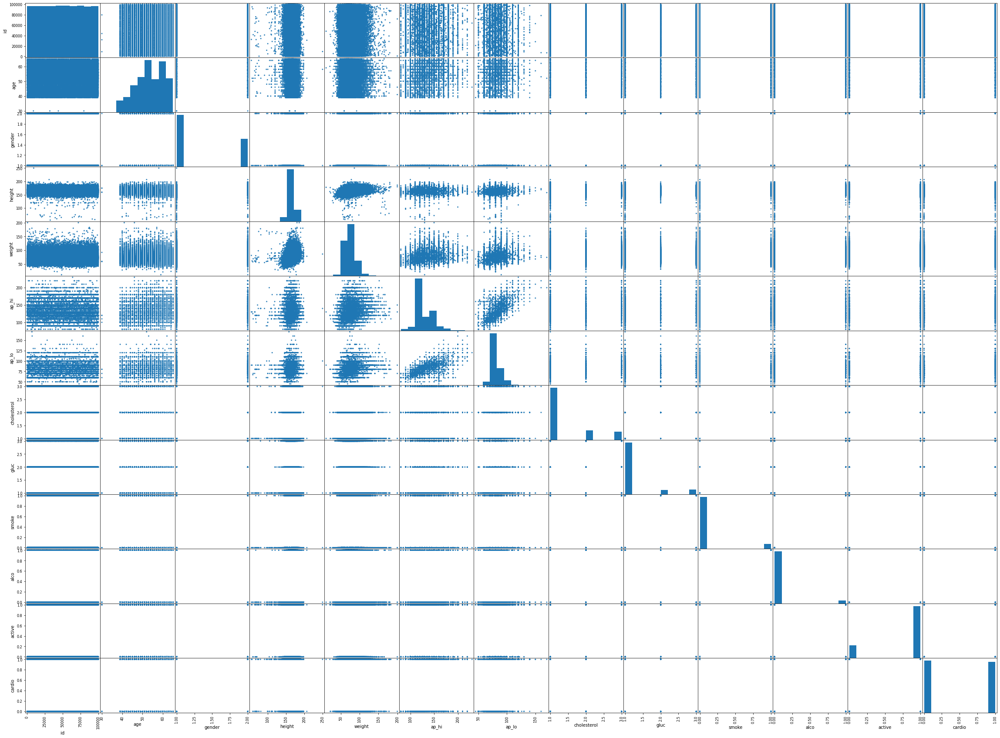

In [ ]:
pd.plotting.scatter_matrix(df, alpha=0.9, figsize=(40,30));

## Feature Engineering


Adding a new attribute <font color="darkblue">**BMI**</font>(Body-Mass Index)

In [ ]:
df.insert(5, 'BMI',df.apply(lambda row: row.weight/(row.height*row.height), axis=1)  )

In [ ]:
df.describe()

,id,age,gender,height,weight,BMI,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
count,68645.000000,68645.000000,68645.000000,68645.000000,68645.000000,68645.000000,68645.000000,68645.000000,68645.000000,68645.000000,68645.000000,68645.000000,68645.000000,68645.000000
mean,49977.304538,53.326928,1.348620,164.362066,74.118137,0.002752,126.664142,81.311064,1.364615,1.225697,0.087974,0.053347,0.803380,0.494661
std,28846.376715,6.767720,0.476537,8.183036,14.329662,0.000605,16.644084,9.409704,0.678886,0.571580,0.283260,0.224726,0.397446,0.499975
min,0.000000,30.000000,1.000000,55.000000,11.000000,0.000347,80.000000,45.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,25003.000000,48.000000,1.000000,159.000000,65.000000,0.002388,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
50%,50016.000000,54.000000,1.000000,165.000000,72.000000,0.002635,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
75%,74876.000000,58.000000,2.000000,170.000000,82.000000,0.003012,140.000000,90.000000,2.000000,1.000000,0.000000,0.000000,1.000000,1.000000
max,99999.000000,65.000000,2.000000,250.000000,200.000000,0.029867,230.000000,170.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000


## One-Hot Encoding

In [ ]:
    df = pd.concat([df, 
         pd.get_dummies(df.gender, drop_first=True, prefix='gender'),
         pd.get_dummies(df.cholesterol, drop_first=True, prefix='cholesterol'), 
         pd.get_dummies(df.gluc, drop_first=True, prefix='gluc'),
         pd.get_dummies(df.alco, drop_first=True, prefix='alco'),
         pd.get_dummies(df.smoke, drop_first=True, prefix='smoke'),
         pd.get_dummies(df.active, drop_first=True, prefix='active')], axis=1)
    df.drop(columns=['gender', 'cholesterol', 'gluc', 'alco','smoke','active'], inplace=True, axis=1)

In [ ]:
df.describe()

,id,age,height,weight,BMI,ap_hi,ap_lo,cardio,gender_2,cholesterol_2,cholesterol_3,gluc_2,gluc_3,alco_1,smoke_1,active_1
count,68645.000000,68645.000000,68645.000000,68645.000000,68645.000000,68645.000000,68645.000000,68645.000000,68645.000000,68645.000000,68645.000000,68645.000000,68645.000000,68645.000000,68645.000000,68645.000000
mean,49977.304538,53.326928,164.362066,74.118137,0.002752,126.664142,81.311064,0.494661,0.348620,0.135407,0.114604,0.073756,0.075971,0.053347,0.087974,0.803380
std,28846.376715,6.767720,8.183036,14.329662,0.000605,16.644084,9.409704,0.499975,0.476537,0.342160,0.318546,0.261376,0.264953,0.224726,0.283260,0.397446
min,0.000000,30.000000,55.000000,11.000000,0.000347,80.000000,45.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,25003.000000,48.000000,159.000000,65.000000,0.002388,120.000000,80.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,50016.000000,54.000000,165.000000,72.000000,0.002635,120.000000,80.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,74876.000000,58.000000,170.000000,82.000000,0.003012,140.000000,90.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
max,99999.000000,65.000000,250.000000,200.000000,0.029867,230.000000,170.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
df.shape

(68645, 16)

## MinMax Scaling

In [ ]:
X = df.iloc[:,[1,2,3,4,5,6,8,9,10,11,12,13,14,15]]
Y = df.iloc[:,7]

In [ ]:
X.iloc[:, :] = MinMaxScaler().fit_transform(X.iloc[:, :]);
X

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1835: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value[:, i].tolist(), pi)


,age,height,weight,BMI,ap_hi,ap_lo,gender_2,cholesterol_2,cholesterol_3,gluc_2,gluc_3,alco_1,smoke_1,active_1
0,0.571429,0.579487,0.269841,0.062655,0.200000,0.28,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0.714286,0.517949,0.391534,0.106560,0.400000,0.36,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
2,0.628571,0.564103,0.280423,0.067874,0.333333,0.20,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,0.514286,0.584615,0.375661,0.085498,0.466667,0.44,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.514286,0.517949,0.238095,0.066192,0.133333,0.12,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69995,0.657143,0.579487,0.343915,0.079458,0.266667,0.28,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
69996,0.914286,0.528205,0.608466,0.159220,0.400000,0.36,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
69997,0.628571,0.656410,0.497354,0.094452,0.666667,0.36,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
69998,0.885714,0.553846,0.322751,0.080040,0.366667,0.28,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


# Applying Models

<font color="darkblue">**Logistic Regression**</font>

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(X,Y,test_size=.2,stratify=Y, random_state=131)

Model Accuracy

In [ ]:
model_logreg = LogisticRegression(max_iter = 500).fit(X_train,Y_train)
model_logreg.score(X_test,Y_test)

0.7336295433024984

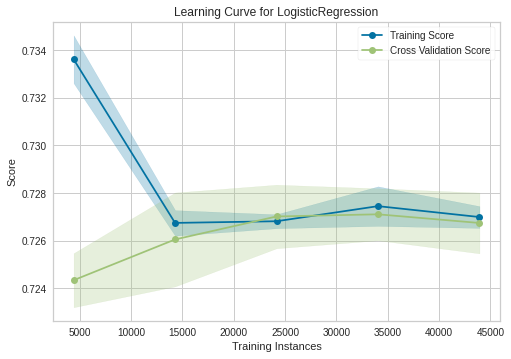

In [ ]:
from yellowbrick.model_selection import LearningCurve
from sklearn.model_selection import StratifiedKFold
cv = StratifiedKFold(n_splits=5)

visualizer = LearningCurve(model_logreg, cv=cv, scoring="accuracy", n_jobs=4)
visualizer.fit(X_train, Y_train)
visualizer.show();

F1 score is: 0.7136032578902028


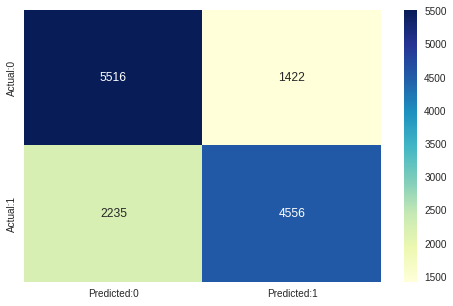

In [ ]:
Y_pred=model_logreg.predict(X_test)
cm=confusion_matrix(Y_test,Y_pred)
conf_matrix=pd.DataFrame(data=cm,columns=['Predicted:0','Predicted:1'],index=['Actual:0','Actual:1'])
plt.figure(figsize = (8,5))
print(f"F1 score is: {f1_score(Y_test, Y_pred)}")
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu")

*The confusion matrix shows 5528+4504 = 10,032 correct predictions and 2287+1410= 3697 incorrect ones.*

In [ ]:
model_logreg = LogisticRegression(C=.01 ,max_iter = 1000).fit(X_train,Y_train)
Y_pred = model_logreg.predict(X_test)
print(f"F1 score is: {f1_score(Y_test, Y_pred)}")
model_logreg.score(X_test,Y_test)

F1 score is: 0.709004591797027


0.7276567849078592

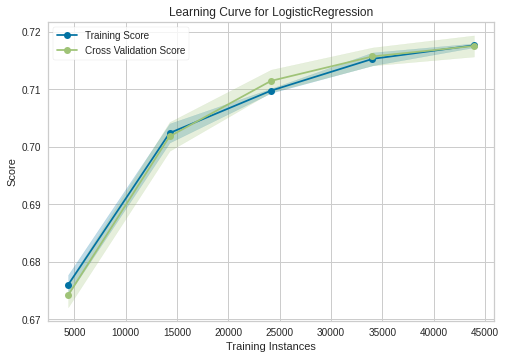

In [ ]:
from yellowbrick.model_selection import LearningCurve
from sklearn.model_selection import StratifiedKFold
cv = StratifiedKFold(n_splits=5)

visualizer = LearningCurve(model_logreg, cv=cv, scoring="accuracy", n_jobs=4)
visualizer.fit(X_train, Y_train)
visualizer.show();

<font color="darkblue">**Support Vector Machine**</font>

Let's try <font color="darkblue">**without**</font> any model parameters at first

In [ ]:
model_svm = SVC().fit(X_train, Y_train)
Y_pred = model_svm.predict(X_test)
print(f"F1 score is: {f1_score(Y_test, Y_pred)}")
model_svm.score(X_test, Y_test)

F1 score is: 0.7181889149102264


0.7370529536018646

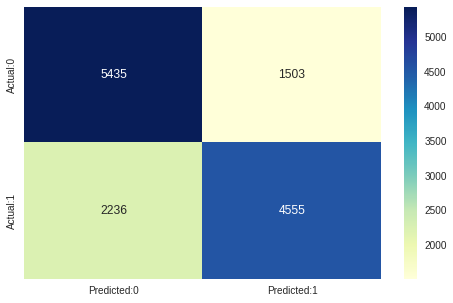

In [ ]:
Y_pred=model_logreg.predict(X_test)
cm=confusion_matrix(Y_test,Y_pred)
conf_matrix=pd.DataFrame(data=cm,columns=['Predicted:0','Predicted:1'],index=['Actual:0','Actual:1'])
plt.figure(figsize = (8,5))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu")

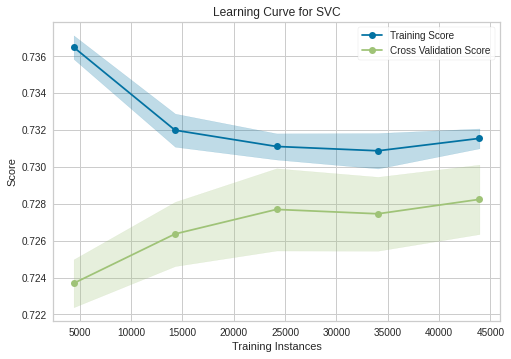

In [ ]:
from yellowbrick.model_selection import LearningCurve
from sklearn.model_selection import StratifiedKFold
cv = StratifiedKFold(n_splits=5)

visualizer = LearningCurve(model_svm, cv=cv, scoring="accuracy", n_jobs=4)
visualizer.fit(X_train, Y_train)
visualizer.show();

*The confusion matrix shows 5337+4569 = 9906 correct predictions and 1601+2222= 3823 incorrect ones.*



Trying SVM by <font color="darkblue">increasing the **regularization**</font> 

In [ ]:
model_svm = SVC(C=0.1).fit(X_train, Y_train)
model_svm.score(X_test, Y_test)

0.7346492825406075

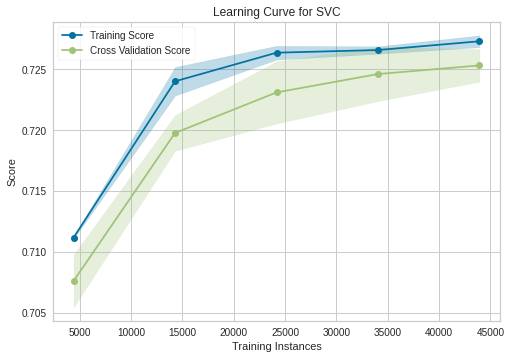

In [ ]:
from yellowbrick.model_selection import LearningCurve
from sklearn.model_selection import StratifiedKFold
cv = StratifiedKFold(n_splits=5)

visualizer = LearningCurve(model_svm, cv=cv, scoring="accuracy", n_jobs=4)
visualizer.fit(X_train, Y_train)
visualizer.show();

F1 score is: 0.7140277886804302


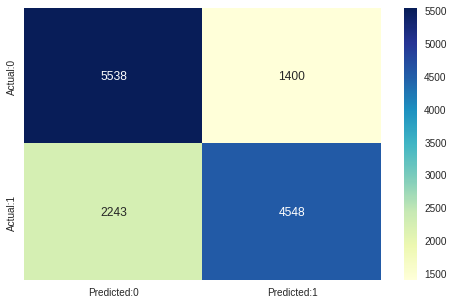

In [ ]:
Y_pred=model_svm.predict(X_test)
print(f"F1 score is: {f1_score(Y_test, Y_pred)}")
cm=confusion_matrix(Y_test,Y_pred)
conf_matrix=pd.DataFrame(data=cm,columns=['Predicted:0','Predicted:1'],index=['Actual:0','Actual:1'])
plt.figure(figsize = (8,5))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu")

*The confusion matrix shows 5337+4569 = 9906 correct predictions and 1601+2222= 3823 incorrect ones.*

### Feature Selection

In [ ]:
knn = KNeighborsClassifier(n_neighbors=3)
sfs = SequentialFeatureSelector(knn)
sfs.fit(X, Y)
SequentialFeatureSelector(estimator=KNeighborsClassifier(n_neighbors=3),
                          n_features_to_select=3)

sfs.get_support()
print(sfs.get_support(indices=True))

[ 4  6  8  9 10 11 12]


In [ ]:
X_train

,age,height,weight,BMI,ap_hi,ap_lo,gender_2,cholesterol_2,cholesterol_3,gluc_2,gluc_3,alco_1,smoke_1,active_1
12034,0.742857,0.564103,0.269841,0.065385,0.266667,0.28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
699,0.914286,0.512821,0.306878,0.085531,0.333333,0.28,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
24026,0.742857,0.507692,0.269841,0.076800,0.200000,0.20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
17079,0.857143,0.471795,0.253968,0.080732,0.466667,0.28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
38952,0.714286,0.507692,0.269841,0.076800,0.400000,0.28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64256,0.400000,0.558974,0.259259,0.063810,0.266667,0.28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
34356,0.685714,0.528205,0.306878,0.081871,0.200000,0.20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
61759,0.514286,0.471795,0.158730,0.052514,0.066667,0.12,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
10455,0.371429,0.630769,0.460317,0.093019,0.400000,0.36,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0


In [ ]:
model_svm = SVC().fit(X_train, Y_train)
model_svm.score(X_test, Y_test)

0.7370529536018646

In [ ]:
X_test # ap_hi, ap_lo, choleterol_2, choleterol_3, gluc_2, smoke_1, active_1

,age,height,weight,BMI,ap_hi,ap_lo,gender_2,cholesterol_2,cholesterol_3,gluc_2,gluc_3,alco_1,smoke_1,active_1
37370,0.514286,0.579487,0.301587,0.069856,0.266667,0.28,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
30803,0.857143,0.564103,0.391534,0.094004,0.266667,0.28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
13145,0.400000,0.564103,0.306878,0.074095,0.266667,0.28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
19181,0.571429,0.523077,0.259259,0.070699,0.400000,0.20,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
58564,0.628571,0.528205,0.312169,0.083228,0.333333,0.36,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58087,0.714286,0.538462,0.285714,0.074252,0.333333,0.28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25018,0.857143,0.564103,0.285714,0.069118,0.233333,0.28,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2328,0.857143,0.584615,0.370370,0.084312,0.400000,0.36,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
36771,0.942857,0.538462,0.259259,0.067636,0.266667,0.28,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


<font color="darkblue">**KNN (K-nearest neighbors)**</font>

In [ ]:
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train, Y_train)
knn.score(X_test, Y_test)

0.6851919294923156

updating parameters <font color="darkblue">**p**</font> and <font color="darkblue">**weights**</font>

In [ ]:
knn_feature_selection = KNeighborsClassifier(n_neighbors=3, p=1, weights="distance")
knn_feature_selection.fit(X_train.iloc[:, [3,  4,  5, 8 ,9 , 10, 0]], Y_train)


print(knn_feature_selection.score(X_train.iloc[:, [ 3, 4,  5,  8, 9, 10 ,  0]], Y_train))
print(knn_feature_selection.score(X_test.iloc[:, [ 3, 4,  5,  8, 9, 10 ,  0]], Y_test))

0.9475016388666326
0.6602083181586423


<font color="darkblue">***Overfitting***</font> above

In [ ]:
knn = KNeighborsClassifier(n_neighbors=10, p=1, weights="uniform")
knn.fit(X_train, Y_train)


print(knn.score(X_train, Y_train))
print(knn.score(X_test, Y_test))

0.7548619710102702
0.72037293320708


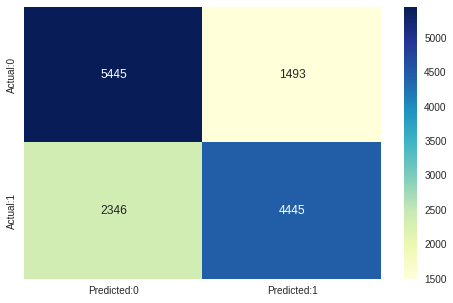

In [ ]:
Y_pred=knn.predict(X_test)
cm=confusion_matrix(Y_test,Y_pred)
conf_matrix=pd.DataFrame(data=cm,columns=['Predicted:0','Predicted:1'],index=['Actual:0','Actual:1'])
plt.figure(figsize = (8,5))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu")

<font color="darkblue">**Random Forest**</font>

In [ ]:
model = RandomForestClassifier()
parameters = {'bootstrap': [True, False],
'max_depth': [1,2,3],
'n_estimators': [10, 50, 100, 200, 500],
'max_features': [1,2,3,4,5,6,7,8]}
clf_rsc = RandomizedSearchCV(model, parameters, verbose=5, scoring="accuracy")
clf_rsc.fit(X_train, Y_train)
clf_rsc.score(X_test, Y_test)

print("Best Params: " + str(clf_rsc.best_params_))
print("Best Score: " + str(clf_rsc.best_score_))
print("Best Estimator: " + str(clf_rsc.best_estimator_))

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END bootstrap=True, max_depth=1, max_features=2, n_estimators=200;, score=0.713 total time=   1.8s
[CV 2/5] END bootstrap=True, max_depth=1, max_features=2, n_estimators=200;, score=0.713 total time=   1.8s
[CV 3/5] END bootstrap=True, max_depth=1, max_features=2, n_estimators=200;, score=0.716 total time=   1.8s
[CV 4/5] END bootstrap=True, max_depth=1, max_features=2, n_estimators=200;, score=0.713 total time=   1.8s
[CV 5/5] END bootstrap=True, max_depth=1, max_features=2, n_estimators=200;, score=0.712 total time=   1.9s
[CV 1/5] END bootstrap=False, max_depth=2, max_features=6, n_estimators=100;, score=0.716 total time=   1.8s
[CV 2/5] END bootstrap=False, max_depth=2, max_features=6, n_estimators=100;, score=0.711 total time=   1.8s
[CV 3/5] END bootstrap=False, max_depth=2, max_features=6, n_estimators=100;, score=0.718 total time=   1.9s
[CV 4/5] END bootstrap=False, max_depth=2, max_features=6, n_estimators=

0.7107915917793233


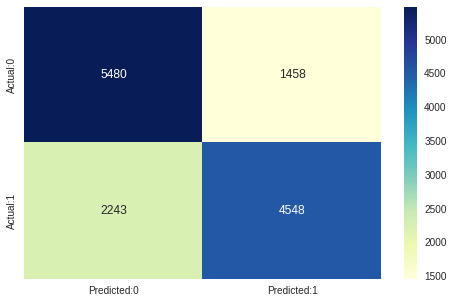

In [ ]:
Y_pred=clf_rsc.predict(X_test)
cm=confusion_matrix(Y_test,Y_pred)
conf_matrix=pd.DataFrame(data=cm,columns=['Predicted:0','Predicted:1'],index=['Actual:0','Actual:1'])
plt.figure(figsize = (8,5))
print(f1_score(Y_test, Y_pred))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu")

*The confusion matrix shows 5481+4563 = 10,044 correct predictions and 1457+2228= 3,685 incorrect ones.*

In [ ]:
model = RandomForestClassifier()
parameters = {'bootstrap': [True, False],
'max_depth': [3, 4, 5, 6],
'n_estimators': [50, 100, 200],
'max_features': [3,4,5,6,7,8]}
clf_rsc = GridSearchCV(model, parameters, verbose=5, scoring="accuracy")
clf_rsc.fit(X_train.iloc[:10000, [ 3, 4,  5,  8, 9, 10 ,  0]], Y_train[:10000])
clf_rsc.score(X_test.iloc[:10000, [ 3, 4,  5,  8, 9, 10 ,  0]], Y_test[:10000])

# print(f"Time taken to execute RandomizedSearchCV with RandomForestClassifier: {round(time.time()-start, 2)}")
print("Best Params: " + str(clf_rsc.best_params_))
print("Best Score: " + str(clf_rsc.best_score_))
print("Best Estimator: " + str(clf_rsc.best_estimator_))

Fitting 5 folds for each of 144 candidates, totalling 720 fits
[CV 1/5] END bootstrap=True, max_depth=3, max_features=3, n_estimators=50;, score=0.736 total time=   0.2s
[CV 2/5] END bootstrap=True, max_depth=3, max_features=3, n_estimators=50;, score=0.735 total time=   0.2s
[CV 3/5] END bootstrap=True, max_depth=3, max_features=3, n_estimators=50;, score=0.714 total time=   0.2s
[CV 4/5] END bootstrap=True, max_depth=3, max_features=3, n_estimators=50;, score=0.719 total time=   0.2s
[CV 5/5] END bootstrap=True, max_depth=3, max_features=3, n_estimators=50;, score=0.715 total time=   0.2s
[CV 1/5] END bootstrap=True, max_depth=3, max_features=3, n_estimators=100;, score=0.737 total time=   0.4s
[CV 2/5] END bootstrap=True, max_depth=3, max_features=3, n_estimators=100;, score=0.735 total time=   0.4s
[CV 3/5] END bootstrap=True, max_depth=3, max_features=3, n_estimators=100;, score=0.710 total time=   0.4s
[CV 4/5] END bootstrap=True, max_depth=3, max_features=3, n_estimators=100;, s

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning: 
120 fits failed out of a total of 720.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
60 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py", line 681, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py", line 459, in fit
    for i, t in enumerate(trees)
  File "/usr/local/lib/python3.7/dist-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/usr/local/lib/python3.7/dist-packages/joblib/pa

Best Params: {'bootstrap': True, 'max_depth': 5, 'max_features': 7, 'n_estimators': 200}
Best Score: 0.7274999999999999
Best Estimator: RandomForestClassifier(max_depth=5, max_features=7, n_estimators=200)


In [ ]:
model_knn = KNeighborsClassifier()

# (n_neighbors=5, *, weights='uniform', algorithm='auto', leaf_size=30, p=2, metric='minkowski', metric_params=None, n_jobs=None)[source]

parameters = {'n_neighbors':[3,4,5,6,7],
              'weights': ['uniform', 'distance'],
              'leaf_size':[20, 30, 40, 50],
              'p':[1,2]
              }
clf_rsc = RandomizedSearchCV(model_knn, parameters, verbose=5, scoring="accuracy")
clf_rsc.fit(X_train.iloc[:, [3,  4,  5, 8 ,9 , 10, 0]], Y_train)
clf_rsc.score(X_test.iloc[:, [3,  4,  5, 8 ,9 , 10, 0]], Y_test)

# print(f"Time taken to execute RandomizedSearchCV with RandomForestClassifier: {round(time.time()-start, 2)}")
print("Best Params: " + str(clf_rsc.best_params_))
print("Best Score: " + str(clf_rsc.best_score_))
print("Best Estimator: " + str(clf_rsc.best_estimator_))

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END leaf_size=50, n_neighbors=4, p=2, weights=uniform;, score=0.678 total time=   1.7s
[CV 2/5] END leaf_size=50, n_neighbors=4, p=2, weights=uniform;, score=0.680 total time=   1.7s
[CV 3/5] END leaf_size=50, n_neighbors=4, p=2, weights=uniform;, score=0.682 total time=   1.9s
[CV 4/5] END leaf_size=50, n_neighbors=4, p=2, weights=uniform;, score=0.682 total time=   1.6s
[CV 5/5] END leaf_size=50, n_neighbors=4, p=2, weights=uniform;, score=0.677 total time=   1.7s
[CV 1/5] END leaf_size=30, n_neighbors=5, p=1, weights=distance;, score=0.669 total time=   1.3s
[CV 2/5] END leaf_size=30, n_neighbors=5, p=1, weights=distance;, score=0.662 total time=   1.4s
[CV 3/5] END leaf_size=30, n_neighbors=5, p=1, weights=distance;, score=0.666 total time=   1.7s
[CV 4/5] END leaf_size=30, n_neighbors=5, p=1, weights=distance;, score=0.669 total time=   1.4s
[CV 5/5] END leaf_size=30, n_neighbors=5, p=1, weights=distance;, score

<font color="darkblue">**NN**</font>

In [ ]:
# Split train set in train and validation set:
X_train, X_test, Y_train, Y_test = train_test_split(X,Y,test_size=.2,stratify=Y, random_state=131)
X_train, X_valid, Y_train, Y_valid = train_test_split(X_train, Y_train, test_size=0.25, random_state=0)



In [ ]:
# from keras.optimizers import Ada

def create_model():
    # Hyperparameter:
    init_w = glorot_uniform(seed=0)
    loss = "binary_crossentropy"
    # optimizer = keras.optimizers.Adadelta()
    
    # Defining the model:
    model = Sequential()

    model.add(Dense(50, kernel_initializer=init_w, input_shape=(X_train.shape[1],)))
    model.add(BatchNormalization())
    model.add(LeakyReLU())
    model.add(Dropout(rate=0.1))

    model.add(Dense(25, kernel_initializer=init_w))
    model.add(BatchNormalization())
    model.add(LeakyReLU())
    model.add(Dropout(rate=0.1))

    model.add(Dense(25, kernel_initializer=init_w))
    model.add(BatchNormalization())
    model.add(LeakyReLU())
    model.add(Dropout(rate=0.1))

    model.add(Dense(12, kernel_initializer=init_w))
    model.add(LeakyReLU())

    model.add(Dense(1, kernel_initializer=init_w))
    model.add(Activation("sigmoid"))
    
    model.summary()
    
    # Training
    model.compile(
        loss=loss,
        optimizer='adam',
        metrics=["accuracy"])

    return model

In [ ]:
nn = create_model()
nn.fit(
    x=X_train,
    y=Y_train,
    verbose=2,
    epochs=50,
    batch_size=256,
    validation_data=[X_valid, Y_valid])

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 50)                750       
                                                                 
 batch_normalization (BatchN  (None, 50)               200       
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 50)                0         
                                                                 
 dropout (Dropout)           (None, 50)                0         
                                                                 
 dense_1 (Dense)             (None, 25)                1275      
                                                                 
 batch_normalization_1 (Batc  (None, 25)               100       
 hNormalization)                                        

In [ ]:
test_score = nn.evaluate(X_test, Y_test)
print("Testing Acc:", test_score[1])

430/430 [==============================] - 1s 2ms/step - loss: 0.5380 - accuracy: 0.7383
Testing Acc: 0.7382912039756775


<font color="darkblue">**XGBoost**</font>


In [ ]:

XGB_model = XGBClassifier(use_label_encoder=False,  eval_metric='mlogloss')
parameters_xg = {'learning_rate': [0.1, 0.2, 1],
'max_depth': [1,2,3,4],
'n_estimators': [50, 100, 200]}

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(X,Y,test_size=.2,stratify=Y, random_state=131)

In [ ]:

start = time.time()

f1 = make_scorer(f1_score , average='macro') #to optimize for the f1 metric
clf_rsc = RandomizedSearchCV(XGB_model, parameters_xg, verbose=3, scoring=f1)
clf_rsc.fit(X_train, Y_train)
clf_rsc.score(X_test, Y_test)

print(f"Time taken to execute RandomizedSearchCV with RandomForestClassifier: {round(time.time()-start, 2)}")
print("Best Params: " + str(clf_rsc.best_params_))
print("Best Score: " + str(clf_rsc.best_score_))
print("Best Estimator: " + str(clf_rsc.best_estimator_))

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END learning_rate=1, max_depth=3, n_estimators=200;, score=0.721 total time=   4.9s
[CV 2/5] END learning_rate=1, max_depth=3, n_estimators=200;, score=0.724 total time=   4.8s
[CV 3/5] END learning_rate=1, max_depth=3, n_estimators=200;, score=0.720 total time=   4.9s
[CV 4/5] END learning_rate=1, max_depth=3, n_estimators=200;, score=0.723 total time=   4.9s
[CV 5/5] END learning_rate=1, max_depth=3, n_estimators=200;, score=0.717 total time=   4.8s
[CV 1/5] END learning_rate=1, max_depth=3, n_estimators=100;, score=0.724 total time=   2.4s
[CV 2/5] END learning_rate=1, max_depth=3, n_estimators=100;, score=0.727 total time=   2.4s
[CV 3/5] END learning_rate=1, max_depth=3, n_estimators=100;, score=0.723 total time=   2.4s
[CV 4/5] END learning_rate=1, max_depth=3, n_estimators=100;, score=0.729 total time=   2.4s
[CV 5/5] END learning_rate=1, max_depth=3, n_estimators=100;, score=0.722 total time=   2.4s
[CV 1/5] 

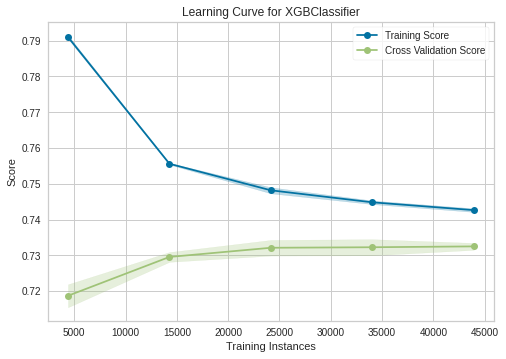

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(X,Y,test_size=.2,stratify=Y, random_state=131)
XGB_model = XGBClassifier(use_label_encoder=False,  eval_metric='mlogloss', n_estimators=200, max_depth=3, learning_rate=0.2)
XGB_model.fit(X_train, Y_train)

# learning curve 
from yellowbrick.model_selection import LearningCurve
from sklearn.model_selection import StratifiedKFold
cv = StratifiedKFold(n_splits=5)

visualizer = LearningCurve(XGB_model, cv=cv, scoring="accuracy", n_jobs=4)
visualizer.fit(X_train, Y_train)
visualizer.show();

In [ ]:
f1 = make_scorer(f1_score , average='macro') #to optimize for the f1 metric

start = time.time()

clf = GridSearchCV(XGB_model, parameters_xg, verbose=5, scoring=f1)
clf.fit(X_train, Y_train)
clf.score(X_test, Y_test)

print(f"Time taken to execute GridSearchCV with RandomForestClassifier: {round(time.time()-start, 2)}")
print("Best Params: " + str(clf.best_params_))
print("Best Score: " + str(clf.best_score_))
print("Best Estimator: " + str(clf.best_estimator_))

Fitting 5 folds for each of 36 candidates, totalling 180 fits
[CV 1/5] END learning_rate=0.1, max_depth=1, n_estimators=50;, score=0.716 total time=   0.8s
[CV 2/5] END learning_rate=0.1, max_depth=1, n_estimators=50;, score=0.715 total time=   0.8s
[CV 3/5] END learning_rate=0.1, max_depth=1, n_estimators=50;, score=0.722 total time=   0.7s
[CV 4/5] END learning_rate=0.1, max_depth=1, n_estimators=50;, score=0.718 total time=   0.7s
[CV 5/5] END learning_rate=0.1, max_depth=1, n_estimators=50;, score=0.713 total time=   0.7s
[CV 1/5] END learning_rate=0.1, max_depth=1, n_estimators=100;, score=0.719 total time=   1.4s
[CV 2/5] END learning_rate=0.1, max_depth=1, n_estimators=100;, score=0.719 total time=   1.4s
[CV 3/5] END learning_rate=0.1, max_depth=1, n_estimators=100;, score=0.724 total time=   1.4s
[CV 4/5] END learning_rate=0.1, max_depth=1, n_estimators=100;, score=0.721 total time=   1.4s
[CV 5/5] END learning_rate=0.1, max_depth=1, n_estimators=100;, score=0.718 total time= 

<font color="darkblue">**Adaboost**</font>

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(X,Y,test_size=.2,stratify=Y, random_state=131)
Ada_Boost = AdaBoostClassifier()
parameters_xg = {'learning_rate': [0.1, 0.2, 1],
'n_estimators': [50, 100, 200]}

In [ ]:
f1 = make_scorer(f1_score , average='macro') #to optimize for the f1 metric

clf_rsc = RandomizedSearchCV(Ada_Boost, parameters_xg, verbose=3, scoring=f1)
clf_rsc.fit(X_train, Y_train)
clf_rsc.score(X_test, Y_test)

print("Best Params: " + str(clf_rsc.best_params_))
print("Best Score: " + str(clf_rsc.best_score_))
print("Best Estimator: " + str(clf_rsc.best_estimator_))

Fitting 5 folds for each of 9 candidates, totalling 45 fits


/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_search.py:296: UserWarning: The total space of parameters 9 is smaller than n_iter=10. Running 9 iterations. For exhaustive searches, use GridSearchCV.
  UserWarning,


[CV 1/5] END learning_rate=0.1, n_estimators=50;, score=0.716 total time=   1.8s
[CV 2/5] END learning_rate=0.1, n_estimators=50;, score=0.713 total time=   1.7s
[CV 3/5] END learning_rate=0.1, n_estimators=50;, score=0.723 total time=   1.7s
[CV 4/5] END learning_rate=0.1, n_estimators=50;, score=0.717 total time=   1.7s
[CV 5/5] END learning_rate=0.1, n_estimators=50;, score=0.713 total time=   1.7s
[CV 1/5] END learning_rate=0.1, n_estimators=100;, score=0.718 total time=   3.4s
[CV 2/5] END learning_rate=0.1, n_estimators=100;, score=0.719 total time=   3.4s
[CV 3/5] END learning_rate=0.1, n_estimators=100;, score=0.724 total time=   3.4s
[CV 4/5] END learning_rate=0.1, n_estimators=100;, score=0.720 total time=   3.4s
[CV 5/5] END learning_rate=0.1, n_estimators=100;, score=0.717 total time=   3.4s
[CV 1/5] END learning_rate=0.1, n_estimators=200;, score=0.722 total time=   6.8s
[CV 2/5] END learning_rate=0.1, n_estimators=200;, score=0.722 total time=   6.8s
[CV 3/5] END learning

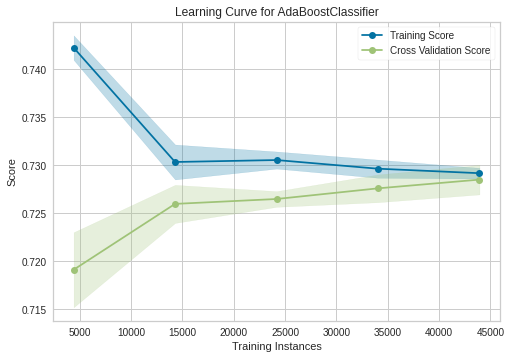

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(X,Y,test_size=.2,stratify=Y, random_state=131)
adaboost_model = AdaBoostClassifier(learning_rate=1, n_estimators=100)
adaboost_model.fit(X_train, Y_train)

# learning curve 
from yellowbrick.model_selection import LearningCurve
from sklearn.model_selection import StratifiedKFold
cv = StratifiedKFold(n_splits=5)

visualizer = LearningCurve(adaboost_model, cv=cv, scoring="accuracy", n_jobs=4)
visualizer.fit(X_train, Y_train)
visualizer.show();

Feature Transform

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(X,Y,test_size=.2,stratify=Y, random_state=131)
from sklearn.preprocessing import PolynomialFeatures
poly = PolynomialFeatures(2)
X_train_ft = poly.fit_transform(X_train)
X_test_ft = poly.fit_transform(X_test)

In [ ]:
model_logreg = LogisticRegression(C=.01 ,max_iter = 1000).fit(X_train_ft,Y_train)
Y_pred = model_logreg.predict(X_test_ft)
print(f"F1 score is: {f1_score(Y_test, Y_pred)}")
model_logreg.score(X_test_ft,Y_test)

F1 score is: 0.713627489262007


0.7329011581324204

In [ ]:
model_svm = SVC().fit(X_train_ft, Y_train)
Y_pred = model_svm.predict(X_test_ft)
print(f"F1 score is: {f1_score(Y_test, Y_pred)}")
model_svm.score(X_test_ft, Y_test)

F1 score is: 0.7173285480221581


0.7361060528807634

In [ ]:
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train_ft, Y_train)
knn.score(X_test_ft, Y_test)

0.6854832835603467

In [ ]:
model = RandomForestClassifier()
parameters = {'bootstrap': [True, False],
'max_depth': [1,2,3],
'n_estimators': [10, 50, 100, 200, 500],
'max_features': [1,2,3,4,5,6,7,8]}
clf_rsc = RandomizedSearchCV(model, parameters, verbose=5, scoring="accuracy")
clf_rsc.fit(X_train_ft, Y_train)
clf_rsc.score(X_test_ft, Y_test)

print("Best Params: " + str(clf_rsc.best_params_))
print("Best Score: " + str(clf_rsc.best_score_))
print("Best Estimator: " + str(clf_rsc.best_estimator_))

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END bootstrap=False, max_depth=3, max_features=1, n_estimators=200;, score=0.719 total time=   3.0s
[CV 2/5] END bootstrap=False, max_depth=3, max_features=1, n_estimators=200;, score=0.716 total time=   2.9s
[CV 3/5] END bootstrap=False, max_depth=3, max_features=1, n_estimators=200;, score=0.723 total time=   3.0s
[CV 4/5] END bootstrap=False, max_depth=3, max_features=1, n_estimators=200;, score=0.718 total time=   2.9s
[CV 5/5] END bootstrap=False, max_depth=3, max_features=1, n_estimators=200;, score=0.720 total time=   3.0s
[CV 1/5] END bootstrap=False, max_depth=1, max_features=3, n_estimators=200;, score=0.714 total time=   2.6s
[CV 2/5] END bootstrap=False, max_depth=1, max_features=3, n_estimators=200;, score=0.714 total time=   2.6s
[CV 3/5] END bootstrap=False, max_depth=1, max_features=3, n_estimators=200;, score=0.719 total time=   2.5s
[CV 4/5] END bootstrap=False, max_depth=1, max_features=3, n_estima

In [ ]:
XGB_model = XGBClassifier(use_label_encoder=False,  eval_metric='mlogloss')
parameters_xg = {'learning_rate': [0.1, 0.2, 1],
'max_depth': [1,2,3,4],
'n_estimators': [50, 100, 200]}


start = time.time()

f1 = make_scorer(f1_score , average='macro') #to optimize for the f1 metric
clf_rsc = RandomizedSearchCV(XGB_model, parameters_xg, verbose=3, scoring=f1)
clf_rsc.fit(X_train_ft, Y_train)
clf_rsc.score(X_test_ft, Y_test)

print(f"Time taken to execute RandomizedSearchCV with RandomForestClassifier: {round(time.time()-start, 2)}")
print("Best Params: " + str(clf_rsc.best_params_))
print("Best Score: " + str(clf_rsc.best_score_))
print("Best Estimator: " + str(clf_rsc.best_estimator_))

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END learning_rate=0.1, max_depth=4, n_estimators=100;, score=0.732 total time=  15.7s
[CV 2/5] END learning_rate=0.1, max_depth=4, n_estimators=100;, score=0.732 total time=  15.8s
[CV 3/5] END learning_rate=0.1, max_depth=4, n_estimators=100;, score=0.730 total time=  15.8s
[CV 4/5] END learning_rate=0.1, max_depth=4, n_estimators=100;, score=0.735 total time=  15.7s
[CV 5/5] END learning_rate=0.1, max_depth=4, n_estimators=100;, score=0.730 total time=  15.6s
[CV 1/5] END learning_rate=0.2, max_depth=4, n_estimators=200;, score=0.731 total time=  30.6s
[CV 2/5] END learning_rate=0.2, max_depth=4, n_estimators=200;, score=0.730 total time=  30.4s
[CV 3/5] END learning_rate=0.2, max_depth=4, n_estimators=200;, score=0.729 total time=  32.4s
[CV 4/5] END learning_rate=0.2, max_depth=4, n_estimators=200;, score=0.731 total time=  30.6s
[CV 5/5] END learning_rate=0.2, max_depth=4, n_estimators=200;, score=0.730 total ti

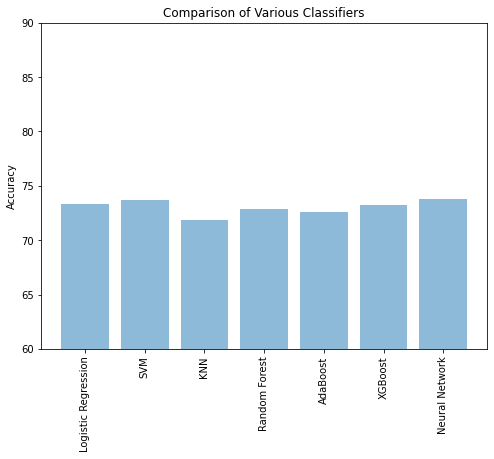

In [ ]:
import matplotlib.pyplot as plt
classifiers = ['Logistic Regression', 'SVM', 'KNN', 'Random Forest', 'AdaBoost', 'XGBoost', 'Neural Network']
accuracies = [73.3, 73.7, 71.89, 72.9, 72.64, 73.28, 73.82]
plt.figure(10, [8,6])
plt.bar(range(len(classifiers)), accuracies, align='center', alpha=0.5)
plt.xticks(range(len(classifiers)), classifiers, rotation=90)
plt.ylabel('Accuracy')
plt.title('Comparison of Various Classifiers')
plt.ylim([60, 90])
plt.show()

LR: 0.726928 (0.005311)
LDA: 0.724252 (0.005803)
KNN: 0.692458 (0.005686)
CART: 0.632166 (0.004723)
NB: 0.690964 (0.004218)
SVM: 0.728968 (0.005199)
NN: 0.731863 (0.006588)


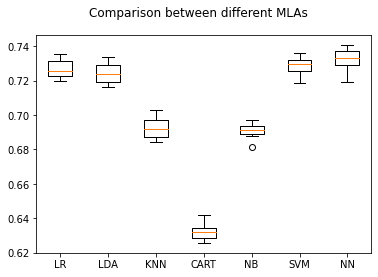

In [ ]:
##boxplot comparison
from sklearn import svm, model_selection, tree, linear_model, neighbors, naive_bayes, ensemble, discriminant_analysis, gaussian_process
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
results = []
names = []
models = []
X_train, X_test, Y_train, Y_test = train_test_split(X,Y,test_size=.2,stratify=Y, random_state=131)
models.append(('LR', LogisticRegression()))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('NB', GaussianNB()))
models.append(('SVM', SVC()))
models.append(('NN', MLPClassifier()))
scoring = 'accuracy'
for name, model in models:
	kfold = model_selection.KFold(n_splits=10, random_state=None)
	cv_results = model_selection.cross_val_score(model, X_train, Y_train, cv=kfold, scoring=scoring)
	results.append(cv_results)
	names.append(name)
	msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
	print(msg)
# boxplot algorithm comparison
fig = plt.figure()
fig.suptitle('Comparison between different MLAs')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()